In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchaudio
import torchaudio.transforms as T
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd
import torch.nn.functional as F
import matplotlib.pyplot as plt
import json
import timm

from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import Dataset, DataLoader
from IPython.display import Audio
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [2]:
!gdown 1PzzqApEdJXHmOMCO4HMyLN7v7O8368cW
!unzip -q results.zip -d results
os.remove("results.zip")

Downloading...
From (original): https://drive.google.com/uc?id=1PzzqApEdJXHmOMCO4HMyLN7v7O8368cW
From (redirected): https://drive.google.com/uc?id=1PzzqApEdJXHmOMCO4HMyLN7v7O8368cW&confirm=t&uuid=62b5971d-b755-4533-83bd-900af19a5ede
To: /kaggle/working/results.zip
100%|██████████████████████████████████████| 1.95G/1.95G [00:50<00:00, 38.4MB/s]


In [8]:
def load_and_get_genres(json_path):
    with open(json_path, "r") as f:
        data = json.load(f)
    return data.get('genres', [])

json_dir = os.path.join("results", "crawled_data")


In [3]:
def load_and_resample_audio(file_path, target_sr=22050):
    audio, sr = librosa.load(file_path, sr=None)
    if sr != target_sr:
        audio = librosa.resample(audio, orig_sr=sr, target_sr=target_sr)
    return audio, target_sr

def audio_to_melspec(audio, sr, n_mels, n_fft=2048, hop_length=512, to_db=False):
    spec = librosa.feature.melspectrogram(
        y=audio,
        sr=sr,
        n_fft=n_fft,
        hop_length=hop_length,
        win_length=None,
        window="hann",
        center=True,
        pad_mode="reflect",
        power=2.0,
        n_mels=n_mels
    )

    if to_db:
        spec = librosa.power_to_db(spec, ref=np.max)

    return spec
    
def normalize_melspec(melspec, norm_range=(0, 1)):
    scaler = MinMaxScaler(feature_range=norm_range)
    melspec = melspec.T
    melspec_normalized = scaler.fit_transform(melspec)
    return melspec_normalized.T

def denormalize_melspec(melspec_normalized, original_melspec, norm_range=(0, 1)):
    scaler = MinMaxScaler(feature_range=norm_range)
    melspec = original_melspec.T
    scaler.fit(melspec)
    melspec_denormalized = scaler.inverse_transform(melspec_normalized.T)
    return melspec_denormalized.T
    
def melspec_to_audio(melspec, sr, n_fft=2048, hop_length=512, n_iter=64):
    if np.any(melspec < 0):
        melspec = librosa.db_to_power(melspec)

    audio_reconstructed = librosa.feature.inverse.mel_to_audio(
        melspec,
        sr=sr,
        n_fft=n_fft,
        hop_length=hop_length,
        win_length=None,
        window="hann",
        center=True,
        pad_mode="reflect",
        power=2.0,
        n_iter=n_iter
    )

    return audio_reconstructed


def display_audio_files(reconstructed_audio, sr, title="", original_audio=None):
    if original_audio is not None:
        print("Original Audio:")
        ipd.display(ipd.Audio(original_audio, rate=sr))
        print("Reconstructed Audio (from Mel Spectrogram):")
    else:
        print(title)

    ipd.display(ipd.Audio(reconstructed_audio, rate=sr))

def show_spectrogram(spectrogram, title="Mel-Spectrogram", denormalize=False, is_numpy=False):
    if not is_numpy:
        spectrogram = spectrogram.squeeze().cpu().numpy()
    plt.figure(figsize=(10, 4))
    if denormalize:
        plt.imshow(spectrogram, aspect="auto", origin="lower", cmap="viridis")
    else:
        plt.imshow(spectrogram, aspect="auto", origin="lower", cmap="viridis", vmin=0, vmax=1)
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Mel Frequency")
    plt.colorbar()
    plt.show()


In [11]:
json_dir = os.path.join("results", "crawled_data")
all_genres = []

for filename in os.listdir(json_dir):
    if filename.endswith('.json'):
        json_path = os.path.join(json_dir, filename)
        genres = load_and_get_genres(json_path)
        all_genres.extend(genres)

unique_genres = set(all_genres)
max_genres = len(unique_genres)
print(f"Total unique genres: {max_genres}")
print(f"Unique genres: {unique_genres}")

genres2idx = {genre: idx for idx, genre in enumerate(unique_genres)}
idx2genres = {idx: genre for genre, idx in genres2idx.items()}

def tokenize(genres):
    return [genres2idx[genre] for genre in genres if genre in genres2idx]

def detokenize_tolist(tokens):
    return [idx2genres[token] for token in tokens if token in idx2genres]

def onehot_encode(tokens, max_genres):
    onehot = np.zeros(max_genres)
    onehot[tokens] = 1
    return onehot

def onehot_decode(onehot):
    return [idx for idx, val in enumerate(onehot) if val == 1]

Total unique genres: 37
Unique genres: {'Reggae - Dub', 'Novelty', 'Blues', 'Chill-out', 'Country', 'Lounge', 'Lo-fi Instrumental', 'Ambient Electronic', 'Deep Funk', 'Pop', 'New Wave', 'Soundtrack', 'Soul-RnB', 'Lo-fi Soul-RnB', 'Disco', 'International', 'Lo-fi Rock', 'Downtempo', 'Folk', 'Hip-Hop Beats', 'Lo-fi Electronic', 'Lo-fi Hip-Hop', 'Jazz: Vocal', 'Classical', 'Ambient', 'Electronic', 'Instrumental', 'Easy Listening', 'Hip-Hop', 'Modern Jazz', 'hiphop', 'Rock', 'Afrobeat', 'Jazz', 'Chiptune', 'Funk', 'Synth Pop'}


In [12]:
class AudioDataset(Dataset):
    def __init__(self, data_dir, json_dir, sample_rate, duration, n_mels, n_genres, testset_amount=10):
        self.data_dir = data_dir
        self.files = [os.path.join(data_dir, f) for f in os.listdir(data_dir) if f.endswith(".mp3")]
        self.json_dir = json_dir
        self.json_files = [os.path.join(json_dir, f) for f in os.listdir(json_dir) if f.endswith(".json")]
        self.sample_rate = sample_rate
        self.duration = duration
        self.fixed_length = sample_rate * duration
        self.n_genres = n_genres
        self.n_mels = n_mels

        audios = []
        for file_path, json_file_path in tqdm(zip(self.files, self.json_files), desc=f"Loading audio files in {data_dir}", unit="file", total=len(self.files)):
            audio, sr = load_and_resample_audio(file_path, target_sr=sample_rate)
            genres_list = load_and_get_genres(json_file_path)

            genres_tokens = tokenize(genres_list)
            genres_input = onehot_encode(genres_tokens, n_genres)
            genres_input = torch.tensor(genres_input, dtype=torch.long).unsqueeze(0)

            n_samples = len(audio)
            n_segments = n_samples // self.fixed_length

            for i in range(n_segments):
                start = i * self.fixed_length
                end = (i + 1) * self.fixed_length
                segment = audio[start:end]
                mel_spec = audio_to_melspec(segment, sr, self.n_mels, to_db=True)
                mel_spec_norm = normalize_melspec(mel_spec)
                mel_spec = torch.tensor(mel_spec, dtype=torch.float32).unsqueeze(0)
                mel_spec_norm = torch.tensor(mel_spec_norm, dtype=torch.float32).unsqueeze(0)
                audios.append((mel_spec_norm, genres_input, mel_spec))

        self.audios = audios[:len(audios) - testset_amount]
        self.testset = audios[len(audios) - testset_amount:]
        print(f"Loaded {len(self.audios)} audio segments from {len(self.files)} files, each with shape: {self.audios[0][0].shape}, {self.audios[0][1].shape}, duration: {duration} seconds")
        print(f"Test set: {len(self.testset)} audio segments")


    def __len__(self):
        return len(self.audios)

    def __getitem__(self, idx):
        mel_spec_part, genres_input, mel_spec = self.audios[idx]

        return mel_spec_part, genres_input, mel_spec

In [13]:
sample_rate = 22050
duration = 3
n_mels = 256

audio_dir = os.path.join("results", "crawled_data", "audio")
json_dir = os.path.join("results", "crawled_data")

testset_amount = 32
trainset = AudioDataset(audio_dir, json_dir, sample_rate, duration,
                        n_mels, max_genres, testset_amount=testset_amount)
testset = trainset.testset

if len(trainset) == 0:
    raise ValueError(f"No .wav file found in {audio_dir}.")

trainloader = DataLoader(trainset, batch_size=128, shuffle=True, num_workers=4)
testloader = DataLoader(testset, batch_size=testset_amount, shuffle=False, num_workers=4)

Loading audio files in results/crawled_data/audio: 100%|██████████| 240/240 [05:07<00:00,  1.28s/file]

Loaded 15254 audio segments from 240 files, each with shape: torch.Size([1, 256, 130]), torch.Size([1, 37]), duration: 3 seconds
Test set: 32 audio segments


tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]])
130


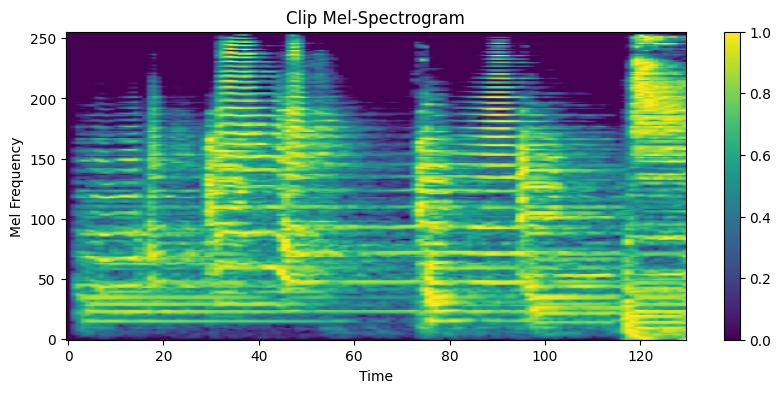

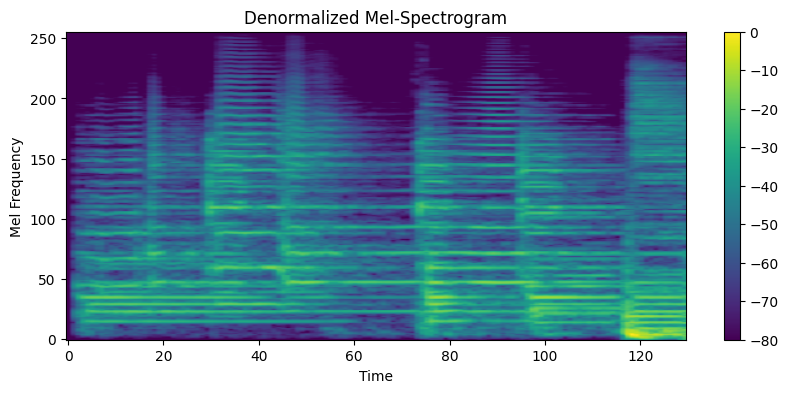

Original Audio after convert to Spectrogram and back to Audio


In [14]:
audios = trainloader.dataset.audios.copy()

frame = audios[0][0].shape[-1]
print(audios[0][1])
print(frame)

for i in range(1):
    show_spectrogram(audios[i][0], title="Clip Mel-Spectrogram")
    spec_denorm = denormalize_melspec(audios[i][0].numpy().squeeze(), audios[i][2].numpy().squeeze())
    show_spectrogram(torch.tensor(spec_denorm), title="Denormalized Mel-Spectrogram", denormalize=True)
    audio_reconstructed = melspec_to_audio(spec_denorm, sample_rate)
    display_audio_files(audio_reconstructed, sample_rate, title="Original Audio after convert to Spectrogram and back to Audio")

In [15]:
json_dir = os.path.join("results", "crawled_data")
all_genres = []

for filename in os.listdir(json_dir):
    if filename.endswith('.json'):
        json_path = os.path.join(json_dir, filename)
        genres = load_and_get_genres(json_path)
        all_genres.extend(genres)

unique_genres = set(all_genres)
max_genres = len(unique_genres)
print(f"Total unique genres: {max_genres}")
print(f"Unique genres: {unique_genres}")

genres2idx = {genre: idx for idx, genre in enumerate(unique_genres)}
idx2genres = {idx: genre for genre, idx in genres2idx.items()}

def tokenize(genres):
    return [genres2idx[genre] for genre in genres if genre in genres2idx]

def detokenize_tolist(tokens):
    return [idx2genres[token] for token in tokens if token in idx2genres]

def onehot_encode(tokens, max_genres):
    onehot = np.zeros(max_genres)
    onehot[tokens] = 1
    return onehot

def onehot_decode(onehot):
    return [idx for idx, val in enumerate(onehot) if val == 1]

Total unique genres: 37
Unique genres: {'Reggae - Dub', 'Novelty', 'Blues', 'Chill-out', 'Country', 'Lounge', 'Lo-fi Instrumental', 'Ambient Electronic', 'Deep Funk', 'Pop', 'New Wave', 'Soundtrack', 'Soul-RnB', 'Lo-fi Soul-RnB', 'Disco', 'International', 'Lo-fi Rock', 'Downtempo', 'Folk', 'Hip-Hop Beats', 'Lo-fi Electronic', 'Lo-fi Hip-Hop', 'Jazz: Vocal', 'Classical', 'Ambient', 'Electronic', 'Instrumental', 'Easy Listening', 'Hip-Hop', 'Modern Jazz', 'hiphop', 'Rock', 'Afrobeat', 'Jazz', 'Chiptune', 'Funk', 'Synth Pop'}


In [16]:
def load_and_get_genres(json_path):
    with open(json_path, "r") as f:
        data = json.load(f)
    return data.get('genres', [])

json_dir = os.path.join("results", "crawled_data")


In [17]:

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

class CVAE(nn.Module):
    def __init__(self, d_model, latent_dim, n_frames, n_mels, n_genres):
        super(CVAE, self).__init__()
        self.d_model = d_model
        self.latent_dim = latent_dim
        self.n_frames = int(np.ceil(n_frames / (2**3)))
        self.n_mels = int(np.ceil(n_mels / (2**3)))
        self.n_genres = n_genres
        print(f"Downsampled dimensions: {self.n_frames} x {self.n_mels}")

        # Encoder layers with proper tracking for skip connections
        self.encoder_conv1 = nn.Conv2d(1 + self.n_genres, d_model, kernel_size=3, stride=2, padding=1)
        self.encoder_bn1 = nn.BatchNorm2d(d_model)
        self.encoder_act1 = nn.SiLU()
        self.encoder_drop1 = nn.Dropout2d(0.05)

        self.encoder_conv2 = nn.Conv2d(d_model, d_model * 2, kernel_size=3, stride=2, padding=1)
        self.encoder_bn2 = nn.BatchNorm2d(d_model * 2)
        self.encoder_act2 = nn.SiLU()
        self.encoder_drop2 = nn.Dropout2d(0.1)

        self.encoder_conv3 = nn.Conv2d(d_model * 2, d_model * 4, kernel_size=3, stride=2, padding=1)
        self.encoder_bn3 = nn.BatchNorm2d(d_model * 4)
        self.encoder_act3 = nn.SiLU()
        self.encoder_drop3 = nn.Dropout2d(0.15)

        self.encoder_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.encoder_flatten = nn.Flatten()

        # Latent space
        self.fc_mu = nn.Linear(d_model * 4, latent_dim)
        self.fc_logvar = nn.Linear(d_model * 4, latent_dim)

        # Decoder
        self.decoder_input = nn.Linear(latent_dim + self.n_genres, d_model * 4 * self.n_frames * self.n_mels)
        
        # Decoder layers with proper channel dimensions for skip connections
        self.decoder_conv1 = nn.ConvTranspose2d(d_model * 4, d_model * 2, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.decoder_bn1 = nn.BatchNorm2d(d_model * 2)
        self.decoder_act1 = nn.SiLU()
        self.decoder_drop1 = nn.Dropout2d(0.1)

        # Note: Skip connection will add d_model*2 channels, so next layer input is d_model*4
        self.decoder_conv2 = nn.ConvTranspose2d(d_model * 4, d_model, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.decoder_bn2 = nn.BatchNorm2d(d_model)
        self.decoder_act2 = nn.SiLU()
        self.decoder_drop2 = nn.Dropout2d(0.05)

        # Note: Skip connection will add d_model channels, so next layer input is d_model*2
        self.decoder_conv3 = nn.ConvTranspose2d(d_model * 2, 1, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.decoder_sigmoid = nn.Sigmoid()

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x, genres_input):
        ori_genres_embed = genres_input.view(genres_input.size(0), -1)
        genres_embed = ori_genres_embed.unsqueeze(-1).unsqueeze(-1)
        genres_embed = genres_embed.expand(-1, -1, x.size(2), x.size(3))
        x_genres = torch.cat((x, genres_embed), dim=1)

        # Encoder pass with skip connection collection
        h = x_genres
        
        # Layer 1
        h = self.encoder_conv1(h)
        h = self.encoder_bn1(h)
        h = self.encoder_act1(h)
        skip1 = h  # Save skip connection before dropout
        h = self.encoder_drop1(h)
        
        # Layer 2  
        h = self.encoder_conv2(h)
        h = self.encoder_bn2(h)
        h = self.encoder_act2(h)
        skip2 = h  # Save skip connection before dropout
        h = self.encoder_drop2(h)
        
        # Layer 3
        h = self.encoder_conv3(h)
        h = self.encoder_bn3(h)
        h = self.encoder_act3(h)
        h = self.encoder_drop3(h)
        
        # Final pooling and flattening
        h = self.encoder_pool(h)
        h = self.encoder_flatten(h)

        # Latent space
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        z = self.reparameterize(mu, logvar)
        z_genres = torch.cat((z, ori_genres_embed), dim=1)

        # Decoder
        h_dec = self.decoder_input(z_genres)
        h_dec = h_dec.view(-1, self.d_model * 4, self.n_frames, self.n_mels)

        # Decoder layer 1
        h_dec = self.decoder_conv1(h_dec)
        h_dec = self.decoder_bn1(h_dec)
        h_dec = self.decoder_act1(h_dec)
        h_dec = self.decoder_drop1(h_dec)
        
        # Add skip connection from encoder layer 2 (matching channels: d_model*2)
        if h_dec.shape[2:] != skip2.shape[2:]:
            # Interpolate to match spatial dimensions
            skip2_resized = F.interpolate(skip2, size=h_dec.shape[2:], mode='bilinear', align_corners=False)
        else:
            skip2_resized = skip2
        h_dec = torch.cat([h_dec, skip2_resized], dim=1)  # Concatenate instead of add
        
        # Decoder layer 2
        h_dec = self.decoder_conv2(h_dec)
        h_dec = self.decoder_bn2(h_dec)
        h_dec = self.decoder_act2(h_dec)
        h_dec = self.decoder_drop2(h_dec)
        
        # Add skip connection from encoder layer 1 (matching channels: d_model)
        if h_dec.shape[2:] != skip1.shape[2:]:
            # Interpolate to match spatial dimensions
            skip1_resized = F.interpolate(skip1, size=h_dec.shape[2:], mode='bilinear', align_corners=False)
        else:
            skip1_resized = skip1
        h_dec = torch.cat([h_dec, skip1_resized], dim=1)  # Concatenate instead of add
        
        # Final decoder layer
        h_dec = self.decoder_conv3(h_dec)
        h_dec = self.decoder_sigmoid(h_dec)

        # Crop/pad to match original input size
        recon = h_dec[:, :, :x.size(2), :x.size(3)]
        return recon, mu, logvar

In [18]:
!gdown 18SIagaWJGFHylo9B5CxuuHg1lOTQiMk5
d_model = 64
latent_dim = 128
lr = 2e-4
num_epochs = 100
step_size = num_epochs//2
verbose_interval = num_epochs//10
gamma = 0.5
sample_rate = 22050
duration = 3
n_mels = 256
audio_dir = os.path.join("results", "crawled_data", "audio")
json_dir = os.path.join("results", "crawled_data")

testset_amount = 32
model = CVAE(d_model, latent_dim, n_mels, frame, max_genres).to(device)
model.load_state_dict(torch.load("model_checkpoint.pth"))

Downloading...
From (original): https://drive.google.com/uc?id=18SIagaWJGFHylo9B5CxuuHg1lOTQiMk5
From (redirected): https://drive.google.com/uc?id=18SIagaWJGFHylo9B5CxuuHg1lOTQiMk5&confirm=t&uuid=17518237-b5e5-4d00-b1f7-451aae1c56b3
To: /kaggle/working/model_checkpoint.pth
100%|██████████████████████████████████████| 96.1M/96.1M [00:03<00:00, 26.7MB/s]
Downsampled dimensions: 32 x 17


<All keys matched successfully>

In [20]:
def inference(model, testloader):
    model.eval()
    with torch.no_grad():
        data, genres_input, ori_data = next(iter(testloader))
        data = data.to(device)
        genres_input = genres_input.to(device)
        recon, _, _ = model(data, genres_input)
        return recon, genres_input, ori_data

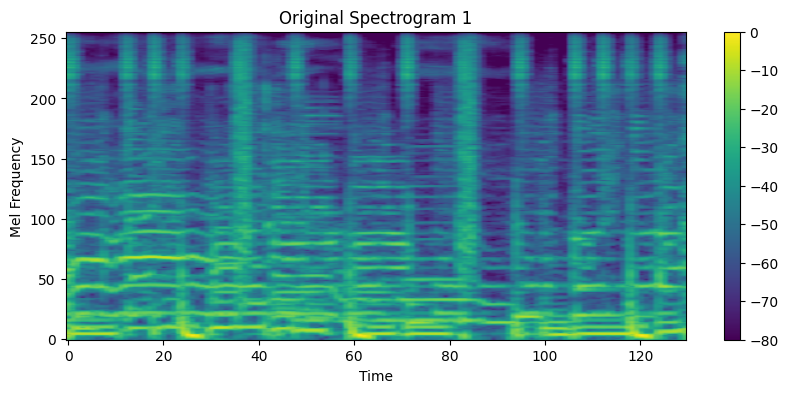

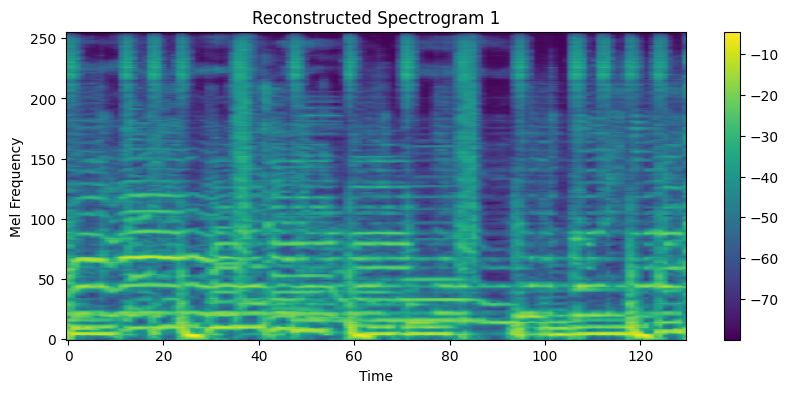

Original Audio:


Reconstructed Audio (from Mel Spectrogram):


----------------------------------------------------------------------------------------------------



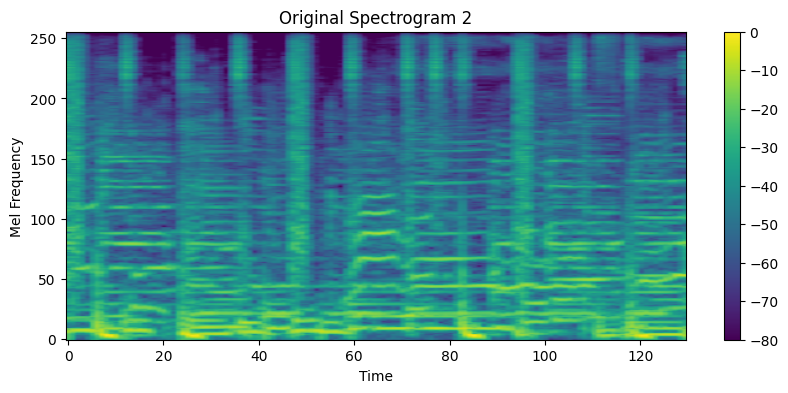

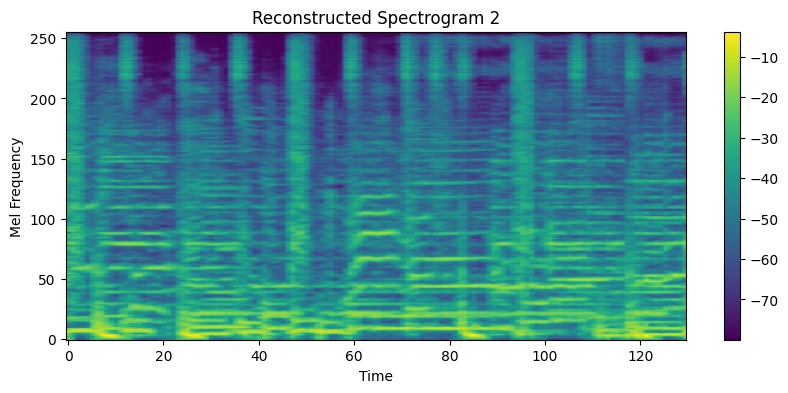

Original Audio:


Reconstructed Audio (from Mel Spectrogram):


----------------------------------------------------------------------------------------------------



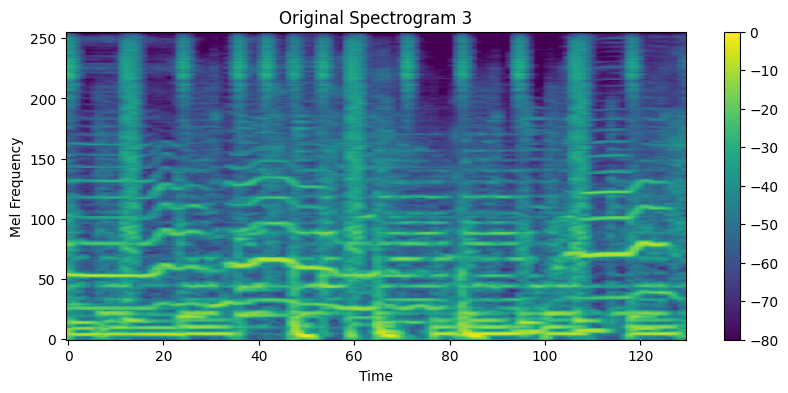

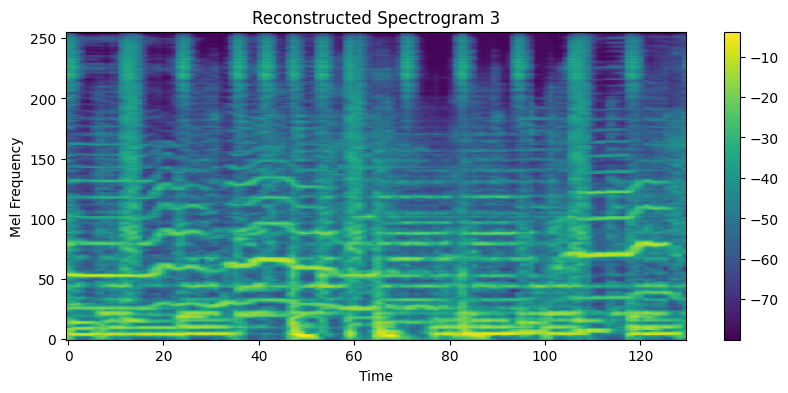

Original Audio:


Reconstructed Audio (from Mel Spectrogram):


----------------------------------------------------------------------------------------------------



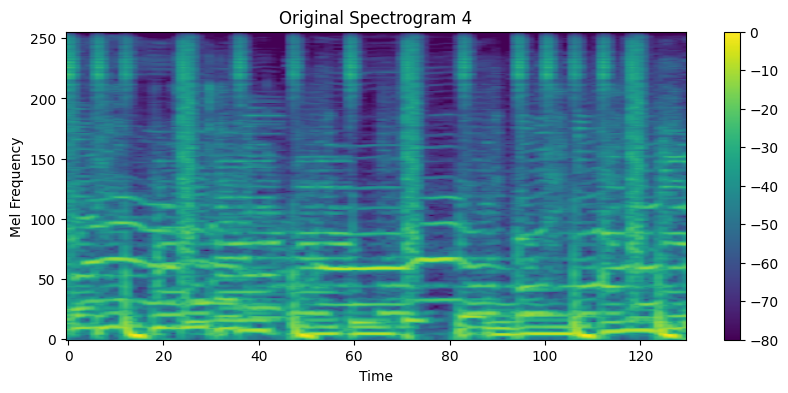

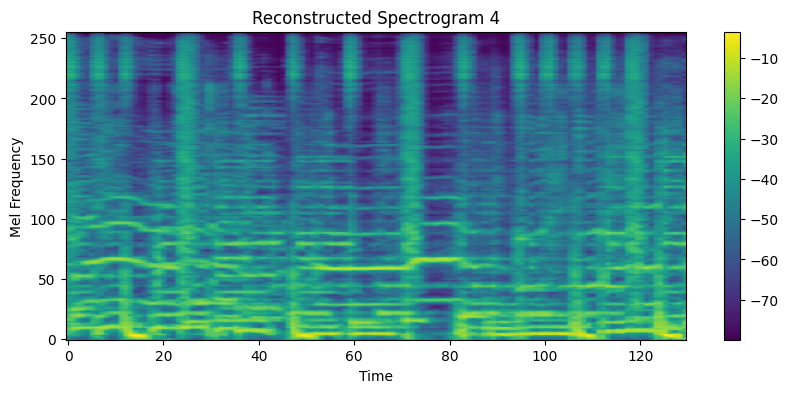

Original Audio:


Reconstructed Audio (from Mel Spectrogram):


----------------------------------------------------------------------------------------------------



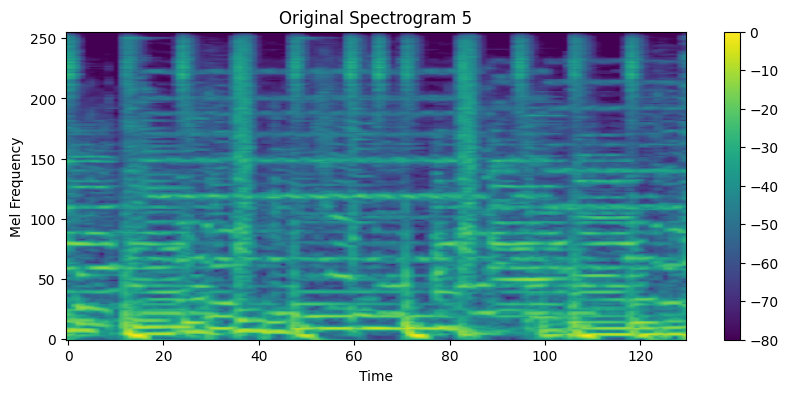

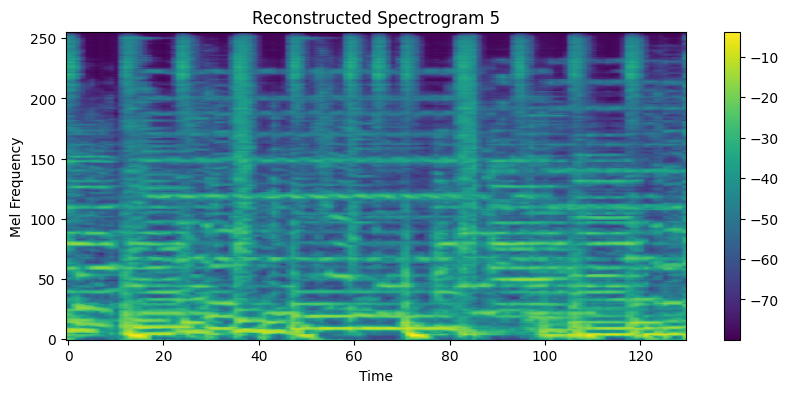

Original Audio:


Reconstructed Audio (from Mel Spectrogram):


----------------------------------------------------------------------------------------------------

Connect all original audio


Connect all reconstructed audio


In [22]:
gen_mels, genres_input, ori_data = inference(model, testloader)
recon_audios = []
ori_audios = []
num_samples = 5
for i in range(len(gen_mels[:num_samples])):
    show_spectrogram(ori_data[i], title=f"Original Spectrogram {i+1}", denormalize=True)
    ori_reconstructed = melspec_to_audio(ori_data[i].cpu().numpy().squeeze(), sample_rate)
    ori_audios.append(ori_reconstructed)

    spec_denorm = denormalize_melspec(gen_mels[i].cpu().numpy().squeeze(), ori_data[i].cpu().numpy().squeeze())
    show_spectrogram(spec_denorm, title=f"Reconstructed Spectrogram {i+1}", denormalize=True, is_numpy=True)
    audio_reconstructed = melspec_to_audio(spec_denorm, sample_rate)
    recon_audios.append(audio_reconstructed)

    display_audio_files(audio_reconstructed, sample_rate, original_audio=ori_reconstructed)
    print("-"*100, end="\n\n")

ori_audios = np.concatenate(ori_audios)
display_audio_files(ori_audios, sample_rate, title="Connect all original audio")
recon_audios = np.concatenate(recon_audios)
display_audio_files(recon_audios, sample_rate, title="Connect all reconstructed audio")

In [25]:
import torch.nn.functional as F

def loss_function(recon_x, x, mu, logvar):
    recon_loss = F.mse_loss(recon_x, x, reduction="sum")
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + KLD

In [23]:
def generate(model, dataloader, genres_list, num_samples=5, diff_level=1):
    model.eval()
    with torch.no_grad():
        data, old_genres_input, ori_data = next(iter(dataloader))
        data = data.to(device)

        genres_tokens = tokenize(genres_list)
        genres_input = onehot_encode(genres_tokens, model.n_genres)
        genres_input = torch.tensor(genres_input, dtype=torch.long).unsqueeze(0)
        genres_input = genres_input.repeat(old_genres_input.shape[0], 1)
        genres_input = genres_input.to(device)

        recon, mu, logvar = model(data, genres_input)
        ori_audios = []
        recon_audios = []
        for i in range(num_samples):
            old_genres_list = detokenize_tolist(onehot_decode(old_genres_input[i].squeeze().tolist()))
            show_spectrogram(data[i], title="Original Spectrogram with Genres: " + ", ".join(old_genres_list))
            show_spectrogram(recon[i], title="Reconstructed Spectrogram with Genres: " + ", ".join(genres_list))

            diff_spectrogram = torch.abs(data[i] - recon[i]) * diff_level
            show_spectrogram(diff_spectrogram, title=f"Difference Spectrogram (|Original - Reconstructed|) * {diff_level}")
            print("Loss: ", loss_function(recon[i], data[i], mu, logvar).item())

            spec_denorm = denormalize_melspec(recon[i].cpu().numpy().squeeze(), ori_data[i].cpu().numpy().squeeze())
            audio_reconstructed = melspec_to_audio(spec_denorm, sr=sample_rate)
            ori_audio = melspec_to_audio(ori_data[i].cpu().numpy().squeeze(), sr=sample_rate)

            recon_audios.append(audio_reconstructed)
            ori_audios.append(ori_audio)

            display_audio_files(ori_audio, sample_rate, title="Reconstructed Audio with Genres: " + ", ".join(old_genres_list))
            display_audio_files(audio_reconstructed, sample_rate, title="Reconstructed Audio with Genres: " + ", ".join(genres_list))

        if num_samples > 1:
            print("-"*100, "Connect all audio", "-"*100)
            recon_ori_audios = np.concatenate(ori_audios)
            display_audio_files(recon_ori_audios, sample_rate, title="Connect all original audio")
            recon_audios = np.concatenate(recon_audios)
            display_audio_files(recon_audios, sample_rate, title="Connect all reconstructed audio")

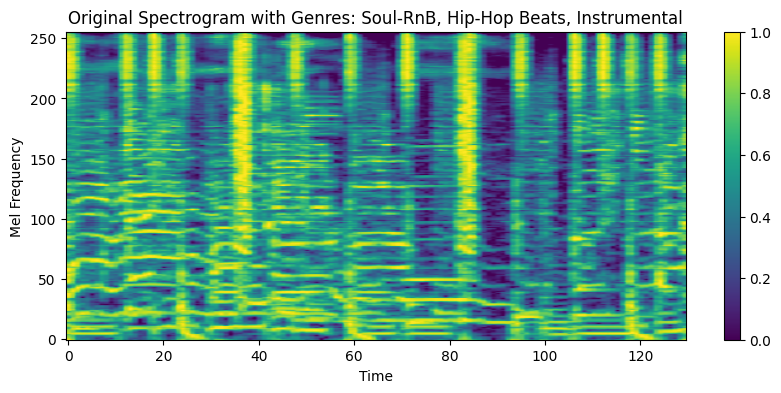

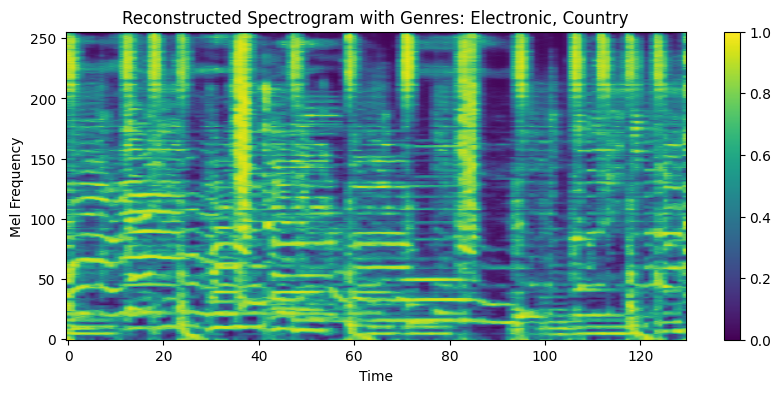

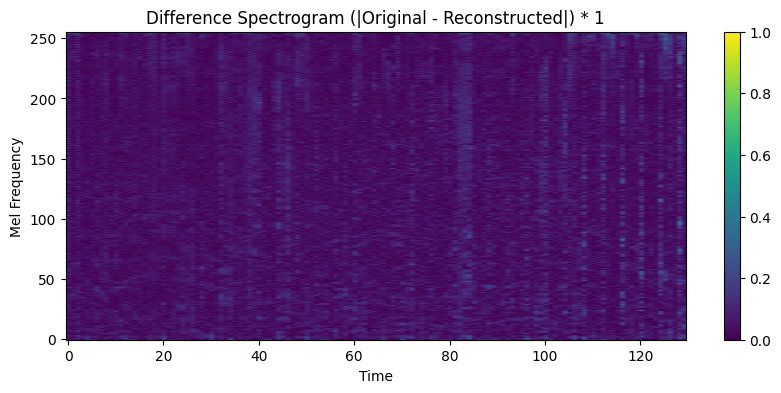

Loss:  129.3480224609375
Reconstructed Audio with Genres: Soul-RnB, Hip-Hop Beats, Instrumental


Reconstructed Audio with Genres: Electronic, Country


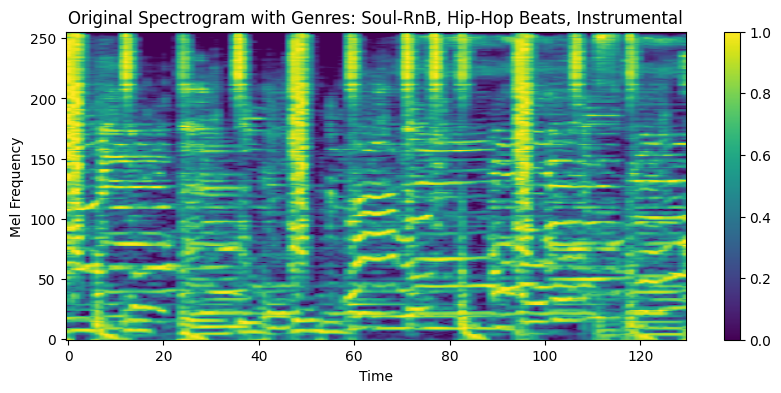

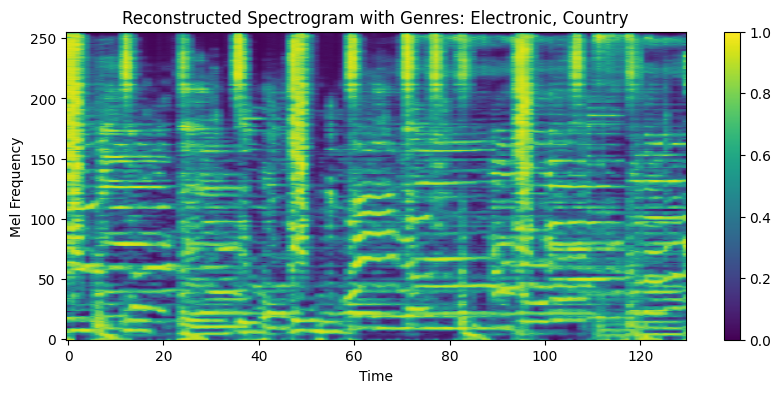

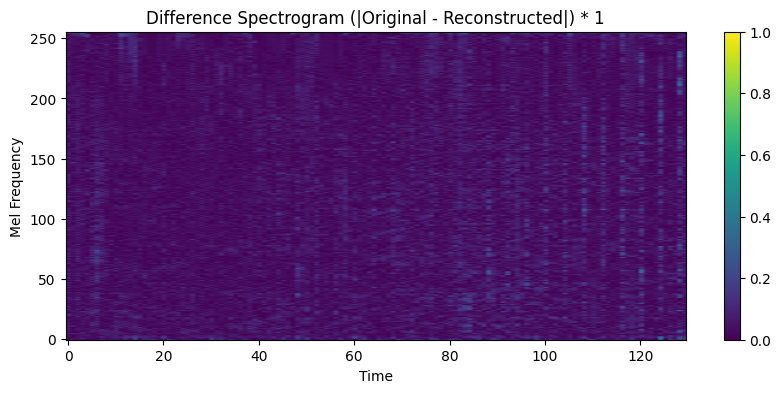

Loss:  125.67713165283203
Reconstructed Audio with Genres: Soul-RnB, Hip-Hop Beats, Instrumental


Reconstructed Audio with Genres: Electronic, Country


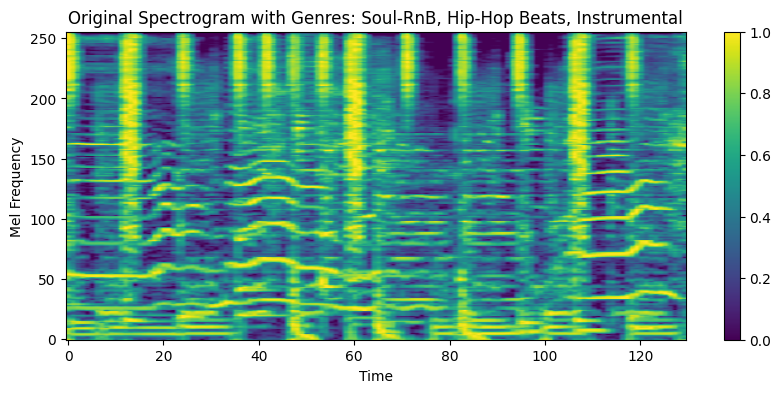

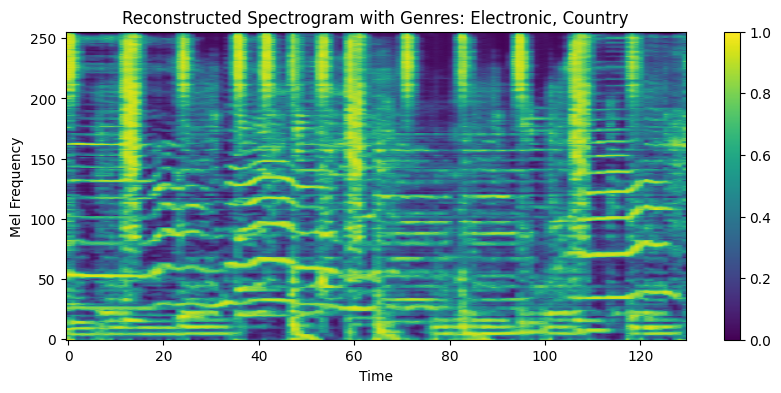

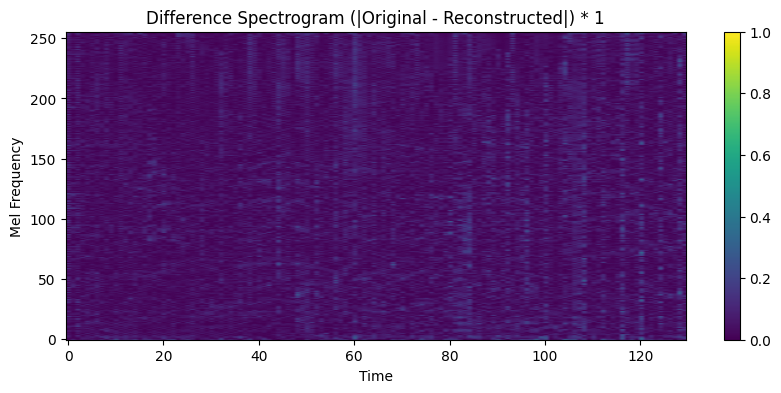

Loss:  122.9446029663086
Reconstructed Audio with Genres: Soul-RnB, Hip-Hop Beats, Instrumental


Reconstructed Audio with Genres: Electronic, Country


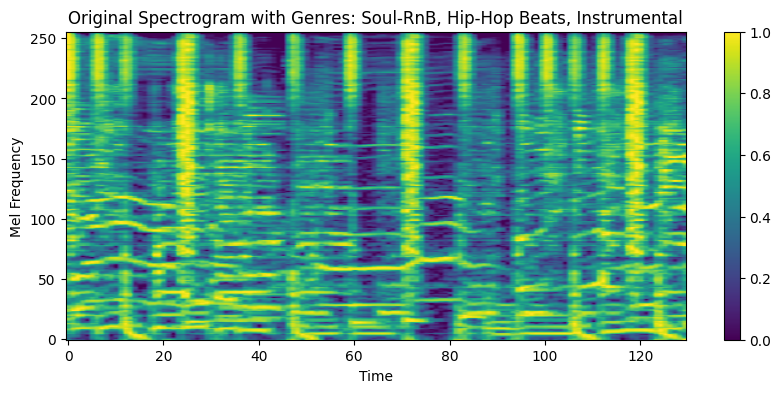

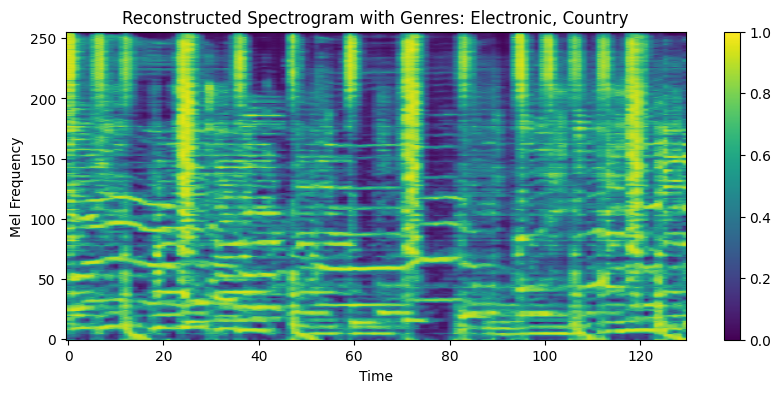

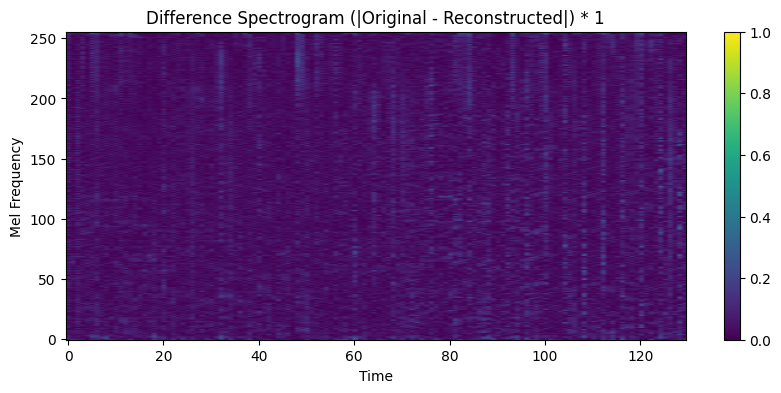

Loss:  125.12844848632812
Reconstructed Audio with Genres: Soul-RnB, Hip-Hop Beats, Instrumental


Reconstructed Audio with Genres: Electronic, Country


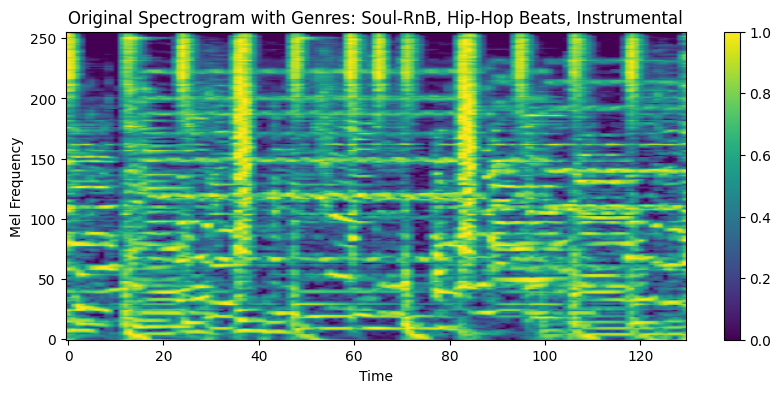

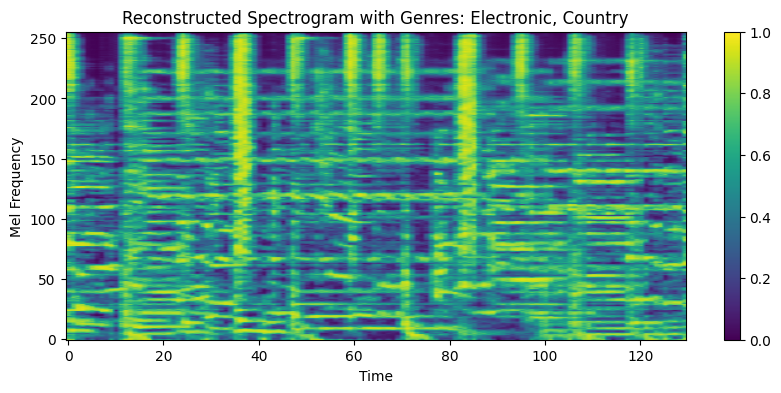

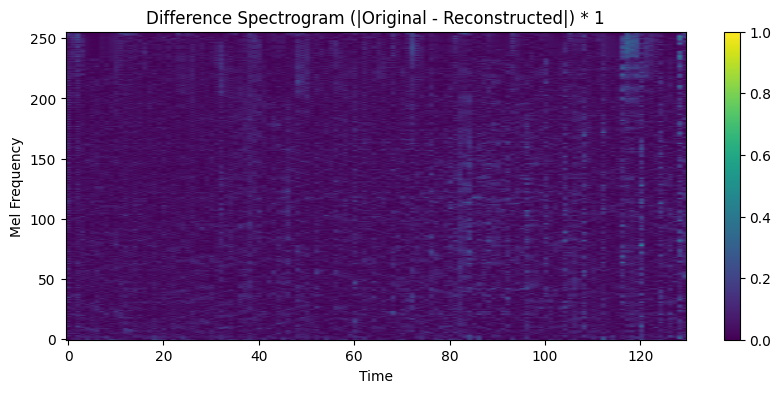

Loss:  139.6471710205078
Reconstructed Audio with Genres: Soul-RnB, Hip-Hop Beats, Instrumental


Reconstructed Audio with Genres: Electronic, Country


---------------------------------------------------------------------------------------------------- Connect all audio ----------------------------------------------------------------------------------------------------
Connect all original audio


Connect all reconstructed audio


In [26]:
generate(model, testloader, ['Electronic', 'Country'], 5, 1)
